# <p style="background-color:#4B0082;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">EX_8</p>

<img src="">

<!-- <img src="https://cdn.dribbble.com/users/223902/screenshots/1772418/dribbble.jpg?compress=1&resize=800x600&vertical=top">

<img src="https://cdn.dribbble.com/users/1209618/screenshots/3000481/media/2c83cb04193be0215eb94f62429b1a70.gif"> -->

    
    

<img src="1.png">

<img src="2.png">

<img src="3.png">

<img src="4.png">

<p>5 . Use contrast enhancement ways and Denoising methods to enhance the following noisy image to the output image. Use both input images for denoising, and compare 'jpg' and 'png' formats! (The pictures are available in the questions folder) (600)
</p>

In [30]:
import numpy as np 
import matplotlib.pyplot as plt 
import cv2 

In [31]:
def show_img_plt(img, c_map ='gray', fig_hight=8, fig_width=6, vmin=0, vmax=255):
    plt.figure(figsize=(fig_hight, fig_width), dpi=100)
    plt.axis('off')
    plt.imshow(img, cmap=c_map, vmin=vmin, vmax=vmax)

In [32]:
def show_multi_img(images , titles ,  row , column , vmin=0 , vmax=255):
    fig = plt.figure(figsize=(15,17) , dpi=100)

    for i in range(len(images)):
        fig.add_subplot(row , column , i+1)
        plt.imshow(images[i] , cmap='gray' , vmin=vmin , vmax=vmax) 
        plt.axis('off')
        plt.title(titles[i])

In [33]:
# read_images 
image_jpg = cv2.imread('images/input.jpg')
image_png = cv2.imread('images/input.png')

In [34]:
# conver bgr 2 rgb 
color_img_jpg = cv2.cvtColor(image_jpg , cv2.COLOR_BGR2RGB)
color_img_png = cv2.cvtColor(image_png , cv2.COLOR_BGR2RGB)

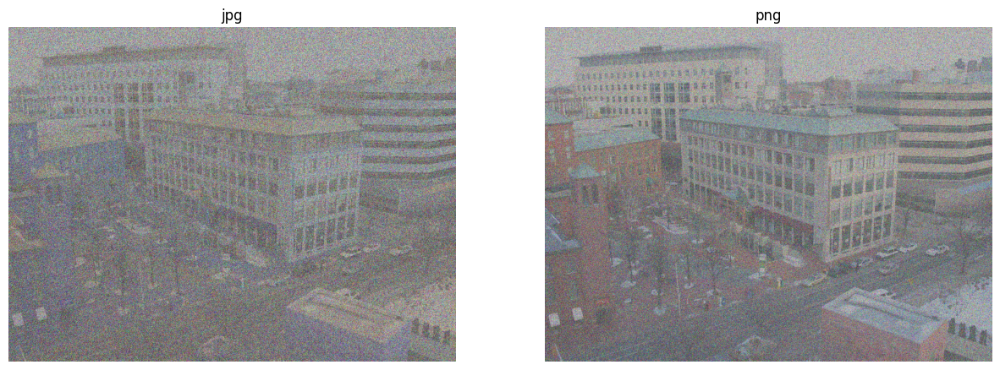

In [35]:
show_multi_img([image_jpg , image_png] , ['jpg' , 'png'] , 1 , 2)

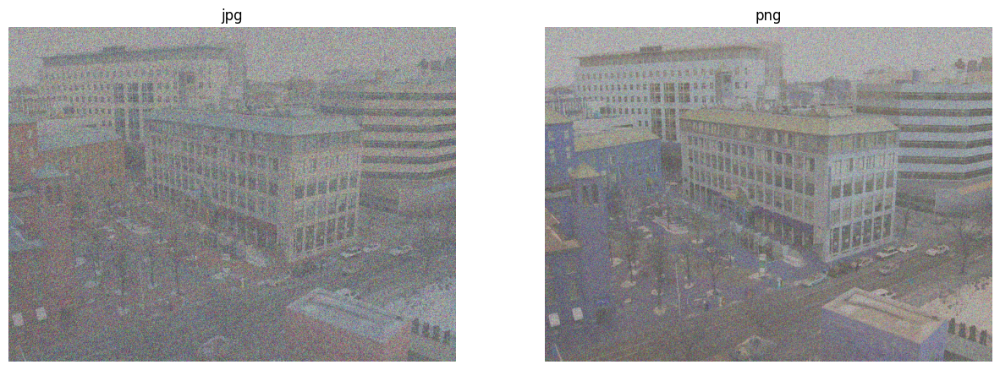

In [36]:
show_multi_img([color_img_jpg , color_img_png] , ['jpg' , 'png'] , 1 , 2)

## Denoising

### 1.Box filter

In [37]:
## box Filter 
img_png_copy = color_img_png.copy()
box_filter_png = cv2.boxFilter(img_png_copy , -1 , (3,3) , normalize=True)

In [38]:
img_jpg_copy = color_img_jpg.copy()
box_filter_jpg = cv2.boxFilter(img_jpg_copy , -1 , (3,3) , normalize=True)

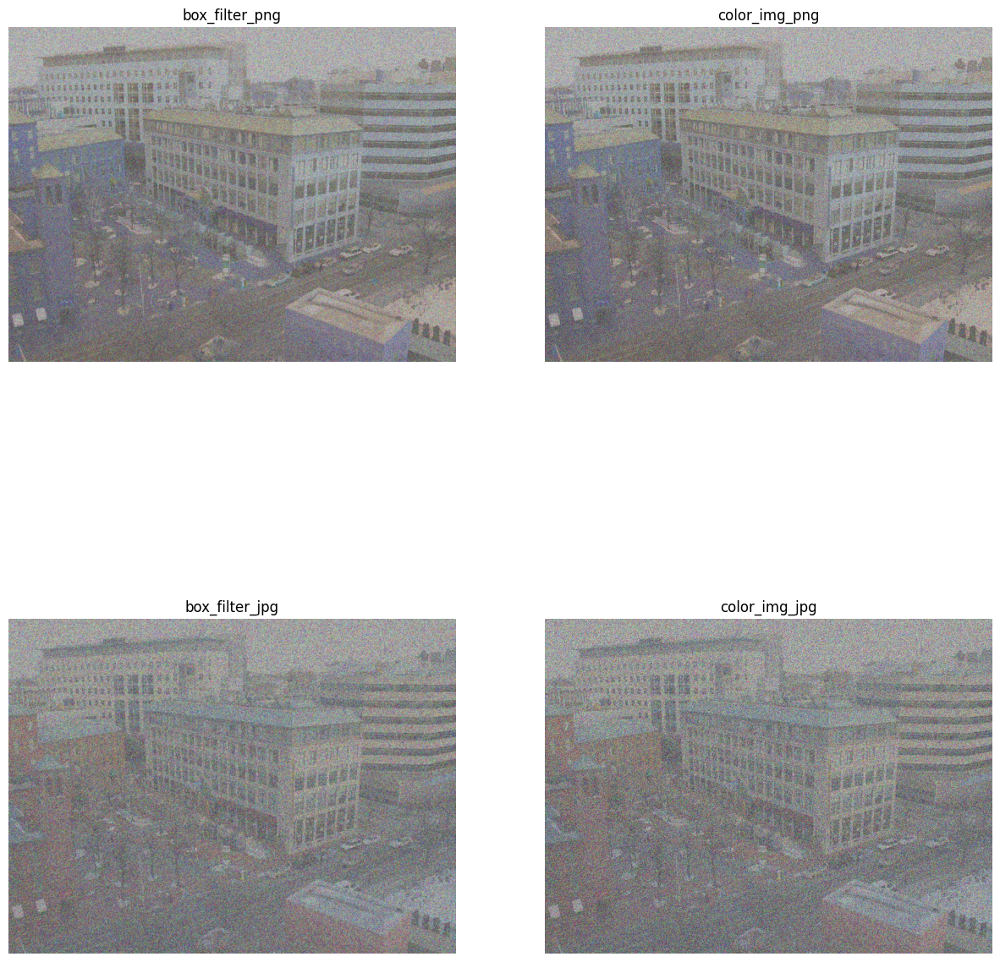

In [39]:
show_multi_img([box_filter_png , color_img_png , box_filter_jpg , color_img_jpg] , ['box_filter_png' , 'color_img_png' , 'box_filter_jpg' , 'color_img_jpg'] ,2,2)

### 2.Median Filter

In [40]:
img_png_copy = color_img_png.copy()
median_png = cv2.medianBlur(img_png_copy , 3)

In [41]:
img_jpg_copy = color_img_jpg.copy()
median_jpg = cv2.medianBlur(img_jpg_copy , 3)

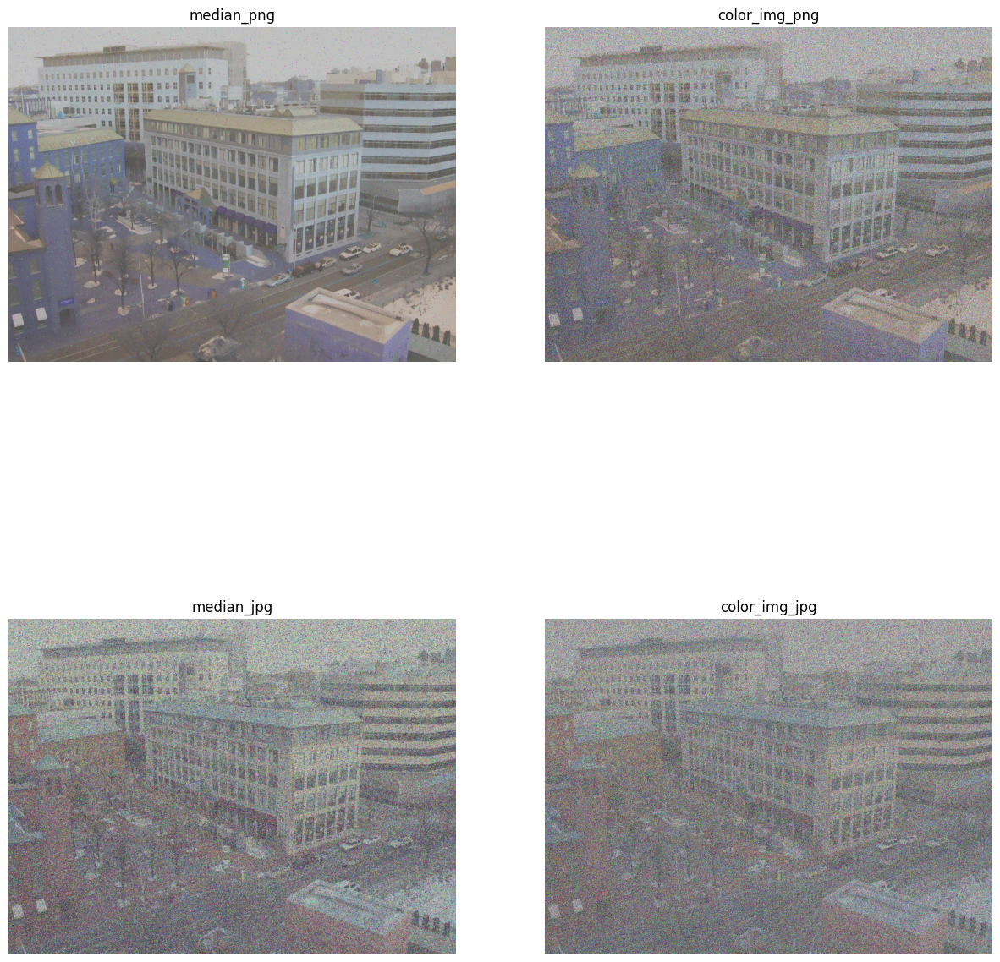

In [42]:
show_multi_img([median_png , color_img_png , median_jpg , color_img_jpg] , ['median_png' , 'color_img_png' , 'median_jpg' , 'color_img_jpg'] ,2,2)

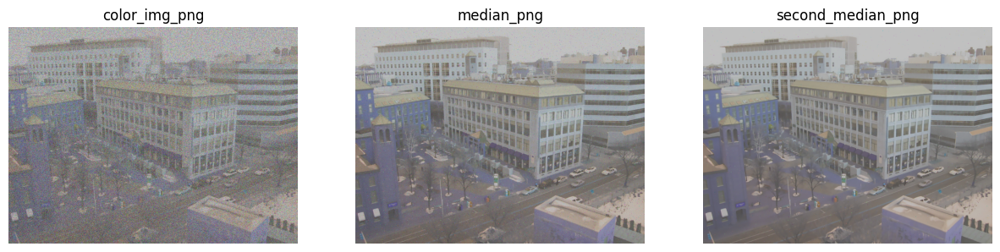

In [43]:
## second median
second_median_png = cv2.medianBlur(median_png , 3)
show_multi_img([color_img_png , median_png , second_median_png] , ['color_img_png' , 'median_png' , 'second_median_png'] ,1,3)

### 3.Gaussian filter

In [44]:
img_png_copy = color_img_png.copy()
Gaussian_png = cv2.GaussianBlur(img_png_copy , (3,3) , 0)

In [45]:
img_jpg_copy = color_img_jpg.copy()
Gaussian_jpg = cv2.GaussianBlur(img_jpg_copy , (3,3) , 0)

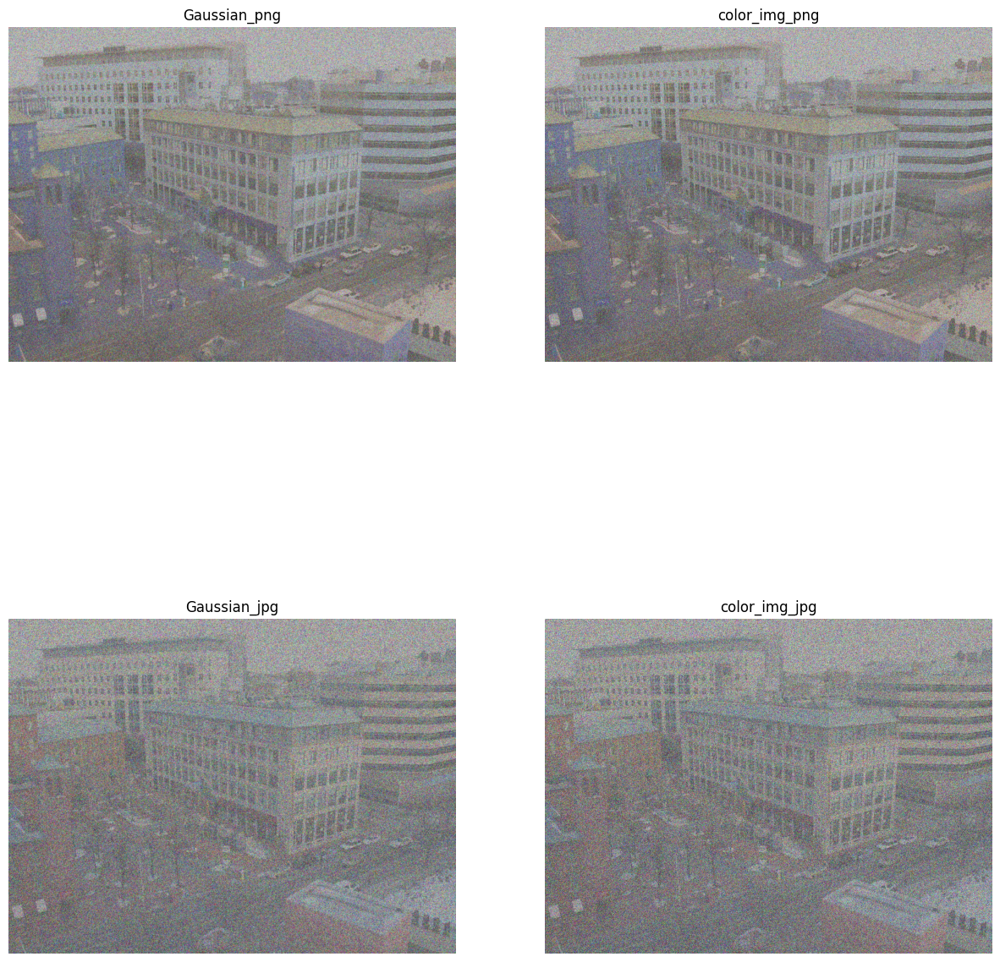

In [46]:
show_multi_img([Gaussian_png , color_img_png , Gaussian_jpg , color_img_jpg] , ['Gaussian_png' , 'color_img_png' , 'Gaussian_jpg' , 'color_img_jpg'] ,2,2)

### 4.median and gusian


In [47]:
Gaussian_median = cv2.GaussianBlur(second_median_png , (3,3) , 0)

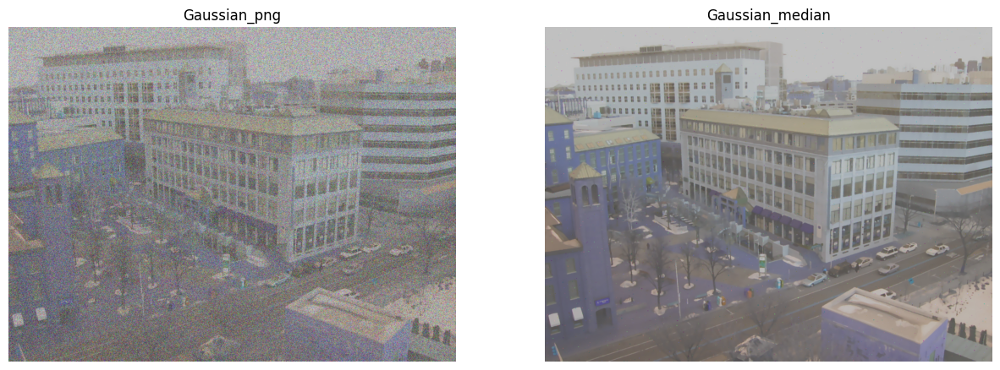

In [48]:
show_multi_img([Gaussian_png , Gaussian_median ] , ['Gaussian_png' , 'Gaussian_median'] ,2,2)

## Enhancment 

### CLAHE


In [49]:
r , g , b = cv2.split(second_median_png)

clahe = cv2.createCLAHE(clipLimit=50)

cl_r = clahe.apply(r)
cl_g = clahe.apply(g)
cl_b = clahe.apply(b)

clahe_image = cv2.merge((cl_r , cl_g , cl_b))

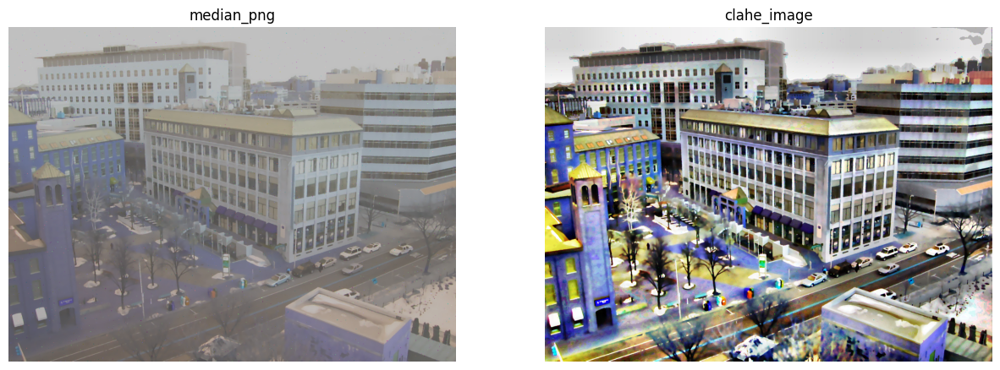

In [50]:
show_multi_img([second_median_png , clahe_image] , ['median_png' , 'clahe_image'] , 1,2)

## def

In [51]:
def denoise(img):
    #denoising
    median_image = cv2.medianBlur(img , 3)
    median_image2 = cv2.medianBlur(median_image , 3)
    
    #enhancment
    r , g , b = cv2.split(median_image2)

    clahe = cv2.createCLAHE(clipLimit=50)

    cl_r = clahe.apply(r)
    cl_g = clahe.apply(g)
    cl_b = clahe.apply(b)

    output = cv2.merge((cl_r , cl_g , cl_b))
    show_multi_img([img , output] , ['img' , 'output'] , 1 , 2)

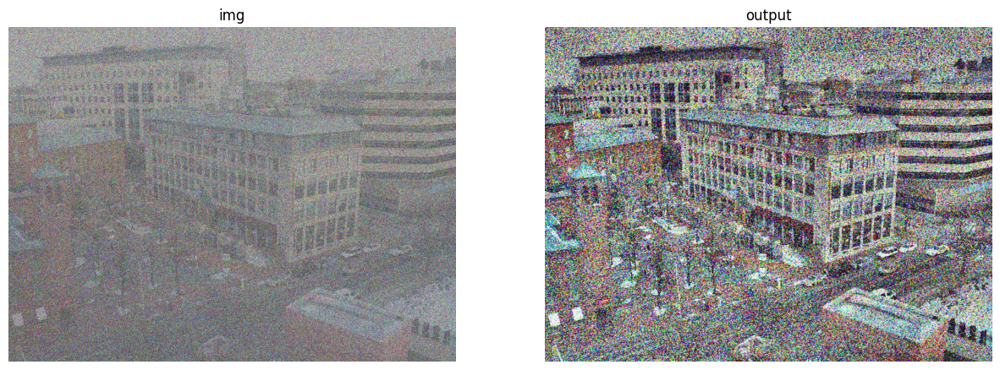

In [52]:
denoise(color_img_jpg)

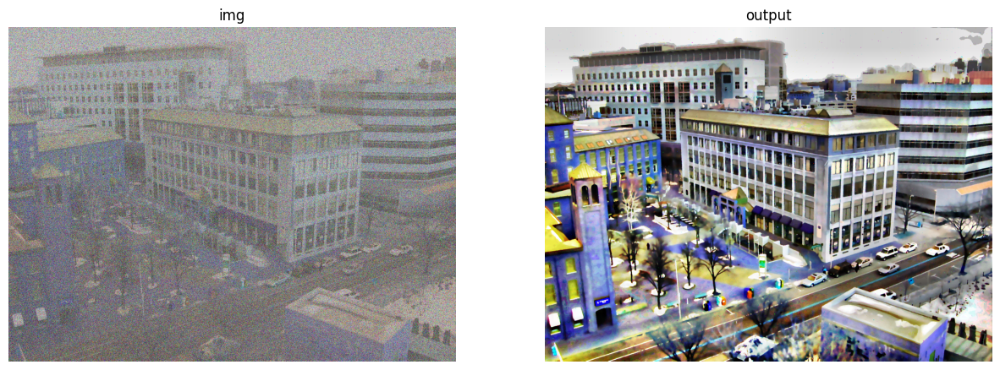

In [53]:
denoise(color_img_png)

<a id="10"></a>
# <p style="background-color:#4B0082;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">👋 END </p>

<p style="font-family:newtimeroman;color:clack;font-size:150%;text-align:center;border-radius:10px 10px;">I hope this netbook is useful for you. I love you all 🤍🌱 </p>